# FitBit Fitness Tracker Analysis

# **Analyzing the Relationship Between Physical Activity, Calories, and Sleep Quality: Identifying Patterns and Anomalies in Healthy Habits**

## **Introduction**

Physical activity, sleep, and energy expenditure are foundational pillars of a healthy lifestyle. However, understanding how these factors interact and influence individual well-being is a complex and evolving challenge in health data science. This project aims to dissect these interactions, identify patterns, and detect anomalies that could signify health risks or opportunities for lifestyle improvement.

Using a comprehensive dataset from Fitbit devices, which captures minute-by-minute data on steps, intensity, calories burned, heart rate, sleep, and more, this project will focus on the following objectives:

1. **Detection of cardiac anomalies**: Leveraging heart rate data to identify potential health risks or irregularities.

2. **Analysis of the impact of physical activity on sleep quality**: Investigating how exercise influences the duration and quality of rest.

3. **Detection of anomalies in daily activity patterns**: Identifying deviations from typical behaviors that might signify unusual events or inconsistencies in physical habits.

4. **Prediction of calories burned**: Developing a model to estimate energy expenditure based on activity levels, heart rate, and other physical metrics.

This structured approach will provide a comprehensive understanding of the dynamics between physical activity, energy expenditure, and sleep quality while uncovering insights into maintaining healthier habits and detecting potential health risks.


## **Dataset**

The dataset comprises data collected from multiple users over several days, with high temporal granularity (minute-by-minute and hour-by-hour). It includes:

- **Physical activity metrics:** Steps, intensity, distance traveled, and active minutes.
- **Health indicators:** Heart rate, calories burned, and METs (Metabolic Equivalent of Task).
- **Sleep data:** Minute-by-minute information on sleep states.
- **Demographics:** Weight, BMI, and body fat percentage.



## **Project Objectives**

1. **Detect Cardiac Anomalies**  
   Use heart rate data to identify irregular patterns that may indicate potential health risks. Analyze how these anomalies correlate with periods of sleep or physical activity.

2. **Analyze the Impact of Physical Activity on Sleep Quality**  
   Investigate how different types and intensities of activity affect sleep duration, quality, and patterns. Identify optimal behaviors for improving rest.

3. **Detect Anomalies in Daily Activity Patterns**  
   Identify outliers in activity intensity, step counts, and other metrics to flag unusual or concerning behaviors that deviate from typical habits.

4. **Predict Calorie Burn**  
   Develop machine learning models to predict calories burned using variables such as heart rate, intensity, and steps. This will provide insights into the efficiency of physical activity and energy expenditure.



## Importing Libraries

In [750]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 

from sklearn.ensemble import IsolationForest

In [751]:
# Read datasets using pandas library 
df_dailyActivity = pd.read_csv('/Users/andreuolaortua/Desktop/code/Machine learning/00 - Projects/Project 19 - FitBit Fitness Tracker Analysis/External Data/Fitabase Data 3.12.16-4.11.16/dailyActivity_merged.csv')
df_heartrate = pd.read_csv('/Users/andreuolaortua/Desktop/code/Machine learning/00 - Projects/Project 19 - FitBit Fitness Tracker Analysis/External Data/Fitabase Data 3.12.16-4.11.16/heartrate_seconds_merged.csv')
df_hourlyCalories = pd.read_csv('/Users/andreuolaortua/Desktop/code/Machine learning/00 - Projects/Project 19 - FitBit Fitness Tracker Analysis/External Data/Fitabase Data 3.12.16-4.11.16/hourlyCalories_merged.csv')
df_hourlyIntensities = pd.read_csv('/Users/andreuolaortua/Desktop/code/Machine learning/00 - Projects/Project 19 - FitBit Fitness Tracker Analysis/External Data/Fitabase Data 3.12.16-4.11.16/hourlyIntensities_merged.csv')
df_hourlySteps = pd.read_csv('/Users/andreuolaortua/Desktop/code/Machine learning/00 - Projects/Project 19 - FitBit Fitness Tracker Analysis/External Data/Fitabase Data 3.12.16-4.11.16/hourlySteps_merged.csv')
df_minuteCaloriesNarrow = pd.read_csv('/Users/andreuolaortua/Desktop/code/Machine learning/00 - Projects/Project 19 - FitBit Fitness Tracker Analysis/External Data/Fitabase Data 3.12.16-4.11.16/minuteCaloriesNarrow_merged.csv')
df_minuteIntensitiesNarrow = pd.read_csv('/Users/andreuolaortua/Desktop/code/Machine learning/00 - Projects/Project 19 - FitBit Fitness Tracker Analysis/External Data/Fitabase Data 3.12.16-4.11.16/minuteIntensitiesNarrow_merged.csv')
df_minuteMETsNarrow = pd.read_csv('/Users/andreuolaortua/Desktop/code/Machine learning/00 - Projects/Project 19 - FitBit Fitness Tracker Analysis/External Data/Fitabase Data 3.12.16-4.11.16/minuteMETsNarrow_merged.csv')
df_minuteSleep = pd.read_csv('/Users/andreuolaortua/Desktop/code/Machine learning/00 - Projects/Project 19 - FitBit Fitness Tracker Analysis/External Data/Fitabase Data 3.12.16-4.11.16/minuteSleep_merged.csv')
df_minuteStepsNarrow = pd.read_csv('/Users/andreuolaortua/Desktop/code/Machine learning/00 - Projects/Project 19 - FitBit Fitness Tracker Analysis/External Data/Fitabase Data 3.12.16-4.11.16/minuteStepsNarrow_merged.csv')
df_weightLogInfo = pd.read_csv('/Users/andreuolaortua/Desktop/code/Machine learning/00 - Projects/Project 19 - FitBit Fitness Tracker Analysis/External Data/Fitabase Data 3.12.16-4.11.16/weightLogInfo_merged.csv')


In [752]:
# Create a lists of datasets for easier iteration and manipulation
datasets = [('df_dailyActivity', df_dailyActivity), 
            ('df_heartrate', df_heartrate), 
            ('df_hourlyCalories', df_hourlyCalories), 
            ('df_hourlyIntensities', df_hourlyIntensities), 
            ('df_hourlySteps', df_hourlySteps), 
            ('df_minuteCaloriesNarrow', df_minuteCaloriesNarrow), 
            ('df_minuteIntensitiesNarrow', df_minuteIntensitiesNarrow),
            ('df_minuteMETsNarrow', df_minuteMETsNarrow), 
            ('df_minuteSleep', df_minuteSleep), 
            ('df_minuteStepsNarrow', df_minuteStepsNarrow), 
            ('df_weightLogInfo', df_weightLogInfo)]
print(len(datasets))

11


In [753]:
# Loop to check all the columns across the datasets
for name, i in datasets:
    print(f"Dataset: {name}")
    print(i.columns)

Dataset: df_dailyActivity
Index(['Id', 'ActivityDate', 'TotalSteps', 'TotalDistance', 'TrackerDistance',
       'LoggedActivitiesDistance', 'VeryActiveDistance',
       'ModeratelyActiveDistance', 'LightActiveDistance',
       'SedentaryActiveDistance', 'VeryActiveMinutes', 'FairlyActiveMinutes',
       'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories'],
      dtype='object')
Dataset: df_heartrate
Index(['Id', 'Time', 'Value'], dtype='object')
Dataset: df_hourlyCalories
Index(['Id', 'ActivityHour', 'Calories'], dtype='object')
Dataset: df_hourlyIntensities
Index(['Id', 'ActivityHour', 'TotalIntensity', 'AverageIntensity'], dtype='object')
Dataset: df_hourlySteps
Index(['Id', 'ActivityHour', 'StepTotal'], dtype='object')
Dataset: df_minuteCaloriesNarrow
Index(['Id', 'ActivityMinute', 'Calories'], dtype='object')
Dataset: df_minuteIntensitiesNarrow
Index(['Id', 'ActivityMinute', 'Intensity'], dtype='object')
Dataset: df_minuteMETsNarrow
Index(['Id', 'ActivityMinute', 'METs'], dtype=

We can integrate and cross-reference the datasets using the common ‘Id’ column as a unique identifier.

In [754]:
# Loop to check the column 'Id' type
for n, i in datasets:
    print(f"Id type of the {n} dataset: ",i['Id'].dtypes)

Id type of the df_dailyActivity dataset:  int64
Id type of the df_heartrate dataset:  int64
Id type of the df_hourlyCalories dataset:  int64
Id type of the df_hourlyIntensities dataset:  int64
Id type of the df_hourlySteps dataset:  int64
Id type of the df_minuteCaloriesNarrow dataset:  int64
Id type of the df_minuteIntensitiesNarrow dataset:  int64
Id type of the df_minuteMETsNarrow dataset:  int64
Id type of the df_minuteSleep dataset:  int64
Id type of the df_minuteStepsNarrow dataset:  int64
Id type of the df_weightLogInfo dataset:  int64


We need to verify whether the ‘df_dailyActivity’ dataset includes all the users present in the other datasets.

In [755]:
# Create new list with all unique 'Id' of all datasets
id_sets = [set(i[1]['Id']) for i in datasets]

# Create new list with all unique 'Id' inside df_dailyActivity dataset
df_dailyActivity_ids = set(df_dailyActivity['Id'])
i=0

for idx_set in id_sets:
    
    # Check if idx_set values is a subset of  df_dailyActivity_ids
    if idx_set.issubset(df_dailyActivity_ids):
        print("All IDs in df_dailyActivity dataset.", len(id_sets[i]))
    else:
        print("NOT all IDs in df_dailyActivity dataset.")
    i+=1    
    

All IDs in df_dailyActivity dataset. 35
All IDs in df_dailyActivity dataset. 14
All IDs in df_dailyActivity dataset. 34
All IDs in df_dailyActivity dataset. 34
All IDs in df_dailyActivity dataset. 34
All IDs in df_dailyActivity dataset. 34
All IDs in df_dailyActivity dataset. 34
All IDs in df_dailyActivity dataset. 34
All IDs in df_dailyActivity dataset. 23
All IDs in df_dailyActivity dataset. 34
All IDs in df_dailyActivity dataset. 11


In [756]:
# Loop to check missing values along all datasets
for n, i in datasets:

    # Checking if there is any missing value
    if i.isnull().values.any() > 0:

        # Prints dataset and number of missing values
        print(f"The {n} dataset have null values.\n", i.isnull().sum())

    # If there is no missing values
    else:

        # Pints dataset with no missing values
        print(f"No null values in {n} dataset.")

No null values in df_dailyActivity dataset.
No null values in df_heartrate dataset.
No null values in df_hourlyCalories dataset.
No null values in df_hourlyIntensities dataset.
No null values in df_hourlySteps dataset.
No null values in df_minuteCaloriesNarrow dataset.
No null values in df_minuteIntensitiesNarrow dataset.
No null values in df_minuteMETsNarrow dataset.
No null values in df_minuteSleep dataset.
No null values in df_minuteStepsNarrow dataset.
The df_weightLogInfo dataset have null values.
 Id                 0
Date               0
WeightKg           0
WeightPounds       0
Fat               31
BMI                0
IsManualReport     0
LogId              0
dtype: int64


We are going to delate the 'Fat' column since there are only two values.

In [757]:
df_weightLogInfo.drop(columns=['Fat'], axis=1, inplace=True)

In [758]:
df_weightLogInfo.head()

,Id,Date,WeightKg,WeightPounds,BMI,IsManualReport,LogId
0,1503960366,4/5/2016 11:59:59 PM,53.299999,117.506384,22.969999,True,1459900799000
1,1927972279,4/10/2016 6:33:26 PM,129.600006,285.719105,46.169998,False,1460313206000
2,2347167796,4/3/2016 11:59:59 PM,63.400002,139.773078,24.770000,True,1459727999000
3,2873212765,4/6/2016 11:59:59 PM,56.700001,125.002104,21.450001,True,1459987199000
4,2873212765,4/7/2016 11:59:59 PM,57.200001,126.104416,21.650000,True,1460073599000


In [759]:
# Loop to check duplicated values along all datasets
for n, i in datasets:

    # Checking if there is any duplicated value
    if i.duplicated().values.any() > 0:
        
        # Prints dataset and number of duplicated values
        print(f"The {n} dataset have duplicated values.\n", i.duplicated().sum())
    
    # If there is no duplicated values
    else:
        
        # Pints dataset with no duplicated values
        print(f"No duplicated values in {n} dataset.")

No duplicated values in df_dailyActivity dataset.
No duplicated values in df_heartrate dataset.
No duplicated values in df_hourlyCalories dataset.
No duplicated values in df_hourlyIntensities dataset.
No duplicated values in df_hourlySteps dataset.
No duplicated values in df_minuteCaloriesNarrow dataset.
No duplicated values in df_minuteIntensitiesNarrow dataset.
No duplicated values in df_minuteMETsNarrow dataset.
The df_minuteSleep dataset have duplicated values.
 525
No duplicated values in df_minuteStepsNarrow dataset.
No duplicated values in df_weightLogInfo dataset.


In [760]:
df_minuteSleep.shape

(198559, 4)

In [761]:
# Drops duplicated values in df_minuteSleep data frame
df_minuteSleep = df_minuteSleep.drop_duplicates()
df_minuteSleep.shape

(198034, 4)

In [762]:
df_dailyActivity.head(10)

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886
5,1503960366,3/30/2016,10970,7.16,7.16,0.0,2.36,0.51,4.29,0.0,30,13,223,1174,1820
6,1503960366,3/31/2016,12256,7.86,7.86,0.0,2.29,0.49,5.04,0.0,33,12,239,820,1889
7,1503960366,4/1/2016,12262,7.87,7.87,0.0,3.32,0.83,3.64,0.0,47,21,200,866,1868
8,1503960366,4/2/2016,11248,7.25,7.25,0.0,3.00,0.45,3.74,0.0,40,11,244,636,1843
9,1503960366,4/3/2016,10016,6.37,6.37,0.0,0.91,1.28,4.18,0.0,15,30,314,655,1850


### Joining different datasets

We need to check if we can join them according to the shape and time values.

In [763]:
for n, i in datasets:
    print(f"The shape of the {n} dataset: ",i.shape)

The shape of the df_dailyActivity dataset:  (457, 15)
The shape of the df_heartrate dataset:  (1154681, 3)
The shape of the df_hourlyCalories dataset:  (24084, 3)
The shape of the df_hourlyIntensities dataset:  (24084, 4)
The shape of the df_hourlySteps dataset:  (24084, 3)
The shape of the df_minuteCaloriesNarrow dataset:  (1445040, 3)
The shape of the df_minuteIntensitiesNarrow dataset:  (1445040, 3)
The shape of the df_minuteMETsNarrow dataset:  (1445040, 3)
The shape of the df_minuteSleep dataset:  (198559, 4)
The shape of the df_minuteStepsNarrow dataset:  (1445040, 3)
The shape of the df_weightLogInfo dataset:  (33, 7)


Joining df_hourlySteps, df_hourlyIntensities, and df_hourlyCalories datasets.

In [764]:
# Convert 'ActivityHour' in  to datetime format
df_hourlySteps['ActivityHour'] = pd.to_datetime(df_hourlySteps['ActivityHour'], format='%m/%d/%Y %I:%M:%S %p')
df_hourlyIntensities['ActivityHour'] = pd.to_datetime(df_hourlyIntensities['ActivityHour'], format='%m/%d/%Y %I:%M:%S %p')
df_hourlyCalories['ActivityHour'] = pd.to_datetime(df_hourlyCalories['ActivityHour'], format='%m/%d/%Y %I:%M:%S %p')

# Merge all dataframes (df_hourlySteps, df_hourlyIntensities, and df_hourlyCalories) on 'Id' and corresponding date columns
df_hourly = pd.merge(df_hourlySteps, df_hourlyIntensities, left_on=['Id', 'ActivityHour'], right_on=['Id', 'ActivityHour'], how='left')
df_hourly = pd.merge(df_hourly, df_hourlyCalories, left_on=['Id', 'ActivityHour'], right_on=['Id', 'ActivityHour'], how='left')

# Display the first few rows of the merged dataframe
df_hourly.head()

,Id,ActivityHour,StepTotal,TotalIntensity,AverageIntensity,Calories
0,1503960366,2016-03-12 00:00:00,0,0,0.0,48
1,1503960366,2016-03-12 01:00:00,0,0,0.0,48
2,1503960366,2016-03-12 02:00:00,0,0,0.0,48
3,1503960366,2016-03-12 03:00:00,0,0,0.0,48
4,1503960366,2016-03-12 04:00:00,0,0,0.0,48


In [765]:
df_hourly.shape

(24084, 6)

Joining df_minuteStepsNarrow, df_minuteMETsNarrow, df_minuteIntensitiesNarrow and df_minuteCaloriesNarrow datasets.

In [766]:
# Convert 'ActivityMinute' in  to datetime format
df_minuteStepsNarrow['ActivityMinute'] = pd.to_datetime(df_minuteStepsNarrow['ActivityMinute'], format='%m/%d/%Y %I:%M:%S %p')
df_minuteMETsNarrow['ActivityMinute'] = pd.to_datetime(df_minuteMETsNarrow['ActivityMinute'], format='%m/%d/%Y %I:%M:%S %p')
df_minuteIntensitiesNarrow['ActivityMinute'] = pd.to_datetime(df_minuteIntensitiesNarrow['ActivityMinute'], format='%m/%d/%Y %I:%M:%S %p')
df_minuteCaloriesNarrow['ActivityMinute'] = pd.to_datetime(df_minuteCaloriesNarrow['ActivityMinute'], format='%m/%d/%Y %I:%M:%S %p')

# Merge all dataframes (df_minuteStepsNarrow, df_minuteMETsNarrow, df_minuteIntensitiesNarrow and df_minuteCaloriesNarrow) on 'Id' and corresponding date columns
df_minute = pd.merge(df_minuteStepsNarrow, df_minuteMETsNarrow, left_on=['Id', 'ActivityMinute'], right_on=['Id', 'ActivityMinute'], how='left')
df_minute = pd.merge(df_minute, df_minuteIntensitiesNarrow, left_on=['Id', 'ActivityMinute'], right_on=['Id', 'ActivityMinute'], how='left')
df_minute = pd.merge(df_minute, df_minuteCaloriesNarrow, left_on=['Id', 'ActivityMinute'], right_on=['Id', 'ActivityMinute'], how='left')

# Display the first few rows of the merged dataframe
df_minute.head()

,Id,ActivityMinute,Steps,METs,Intensity,Calories
0,1503960366,2016-03-12 00:00:00,0,10,0,0.7973
1,1503960366,2016-03-12 00:01:00,0,10,0,0.7973
2,1503960366,2016-03-12 00:02:00,0,10,0,0.7973
3,1503960366,2016-03-12 00:03:00,0,10,0,0.7973
4,1503960366,2016-03-12 00:04:00,0,10,0,0.7973


In [767]:
df_minute.Intensity.value_counts()

Intensity
0    1234832
1     178773
3      19098
2      12337
Name: count, dtype: int64

In [768]:
df_calories_day = df_minute.groupby(['Id', df_minute['ActivityMinute'].dt.date]).agg(total_day_calories=('Calories', 'sum')).reset_index()
df_calories_day[df_calories_day['Id']==1503960366]

,Id,ActivityMinute,total_day_calories
0,1503960366,2016-03-12,2227.656175
1,1503960366,2016-03-13,2100.885482
2,1503960366,2016-03-14,1829.046310
3,1503960366,2016-03-15,2112.150041
4,1503960366,2016-03-16,1965.126859
5,1503960366,2016-03-17,2039.048013
6,1503960366,2016-03-18,2003.320013
7,1503960366,2016-03-19,2059.406784
8,1503960366,2016-03-20,2094.973672
9,1503960366,2016-03-21,1846.244385


Calories burned per day match with the 'dailyActivity_merged.csv' dataset.

## Visualizating Data

### Understanding the relation between diferents variables

In [769]:
df_dailyActivity.dtypes

Id                            int64
ActivityDate                 object
TotalSteps                    int64
TotalDistance               float64
TrackerDistance             float64
LoggedActivitiesDistance    float64
VeryActiveDistance          float64
ModeratelyActiveDistance    float64
LightActiveDistance         float64
SedentaryActiveDistance     float64
VeryActiveMinutes             int64
FairlyActiveMinutes           int64
LightlyActiveMinutes          int64
SedentaryMinutes              int64
Calories                      int64
dtype: object

In [770]:
def plottingData_daily_byId(barplot_variable, lineplot_variable, title):
    # Convert 'ActivityDate' in df_dailyActivity to datetime format, remove timezone info
    df_dailyActivity['ActivityDate'] = pd.to_datetime(df_dailyActivity['ActivityDate']).dt.tz_localize(None)

    # Convert 'ActivityDate' column to string format for plotting
    df_dailyActivity['ActivityDate'] = df_dailyActivity['ActivityDate'].astype(str)

    # Set the number of rows and columns for the subplots grid
    n_rows = 12  
    n_cols = 3  

    # Create a figure with subplots (12 rows, 3 columns) with a large size
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(40, 50))

    # Flatten the axes array to make it easier to iterate over
    axes = axes.flatten()

    # Loop through each 'Id' and corresponding filtered data from df_dailyActivity
    for idx, (id_specific, df_filtered) in enumerate(df_dailyActivity.groupby('Id')):
        ax = axes[idx]  # Select the subplot for this ID
        
        # Create a barplot of 'TotalSteps' against 'ActivityDate'
        sns.barplot(x='ActivityDate', y=barplot_variable, data=df_filtered, ax=ax)
        
        # Annotate the bars with their respective heights (total steps)
        for p in ax.patches:
            ax.annotate(f'{p.get_height():,.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='center', fontsize=12, color='black', xytext=(0, 10), textcoords='offset points')
        
        # Create a second y-axis for the line plot (TotalDistance)
        ax2 = ax.twinx()
        
        # Create a lineplot of 'TotalDistance' against 'ActivityDate' with a red color
        sns.lineplot(x='ActivityDate', y=lineplot_variable, data=df_filtered, ax=ax2, color='red', marker='o', linewidth=2)

        # Set the title of the subplot
        ax.set_title(f'{title} for ID {id_specific}')
        
        # Set labels for the x and y axes
        ax.set_xlabel('Date')
        ax.set_ylabel(barplot_variable)
        
        # Set label for the secondary y-axis
        ax2.set_ylabel(lineplot_variable)
        
        # Rotate the x-axis labels for better readability
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

    # Adjust the layout to prevent overlap of subplots
    plt.tight_layout()

    # Show the plot
    plt.show()

In [771]:
df_dailyActivity.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886


/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a Fi

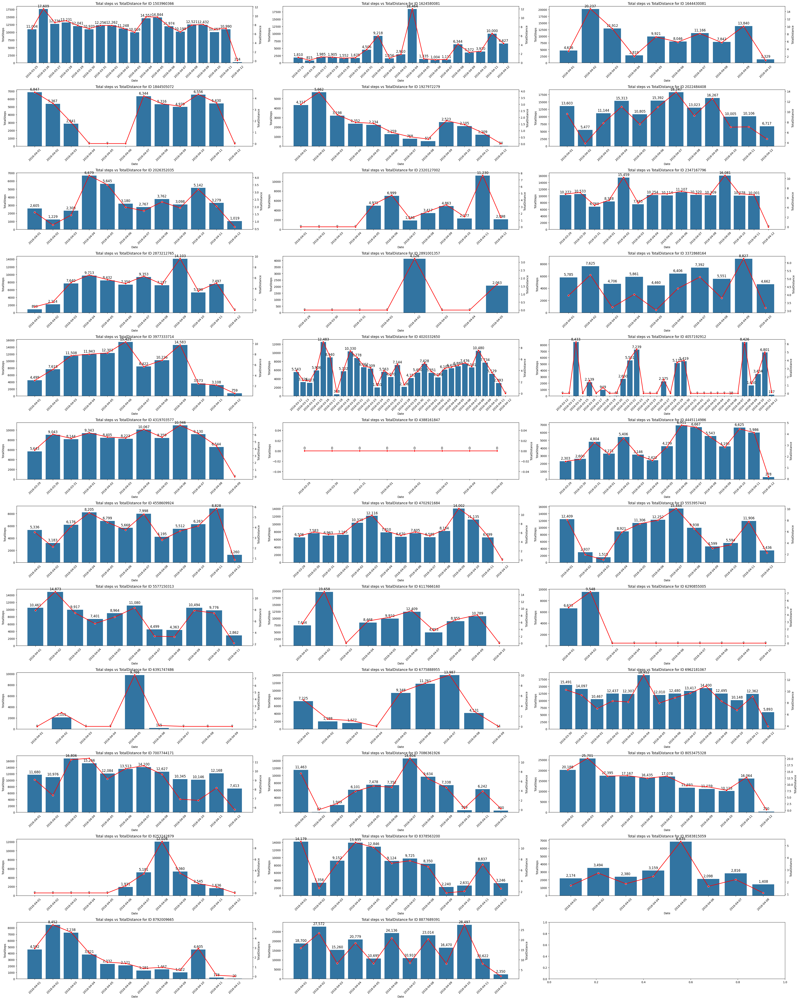

In [772]:
plottingData_daily_byId('TotalSteps', 'TotalDistance', 'Total steps vs TotalDistance')

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a Fi

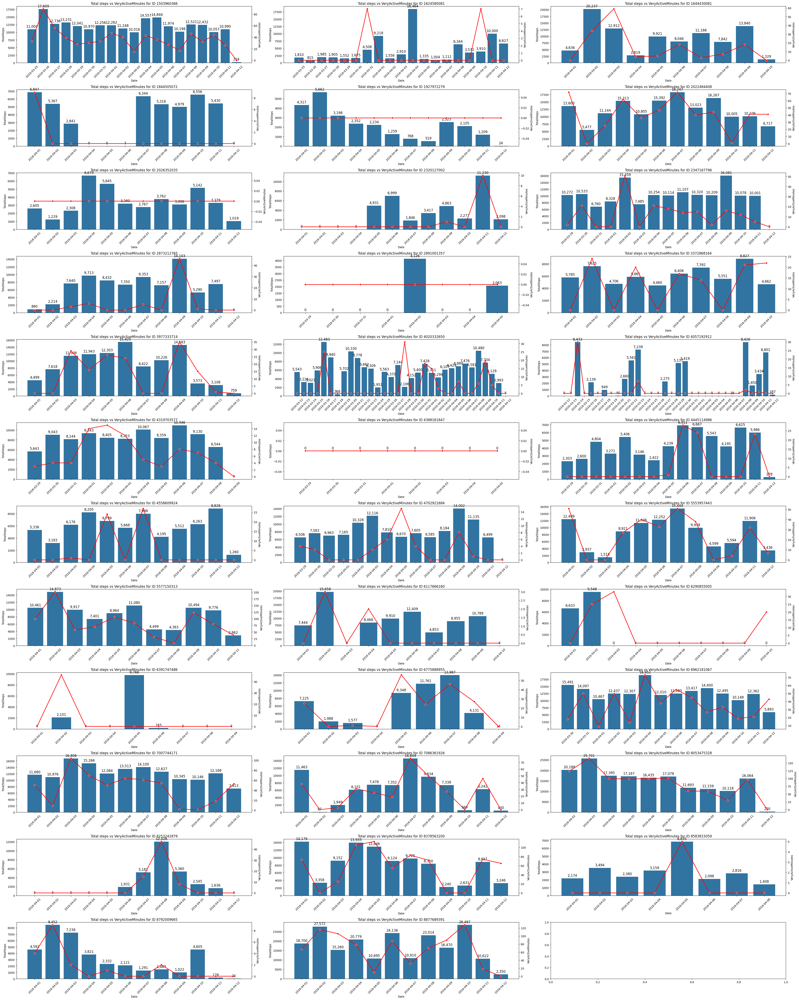

In [773]:
plottingData_daily_byId('TotalSteps', 'VeryActiveMinutes', 'Total steps vs VeryActiveMinutes')

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a Fi

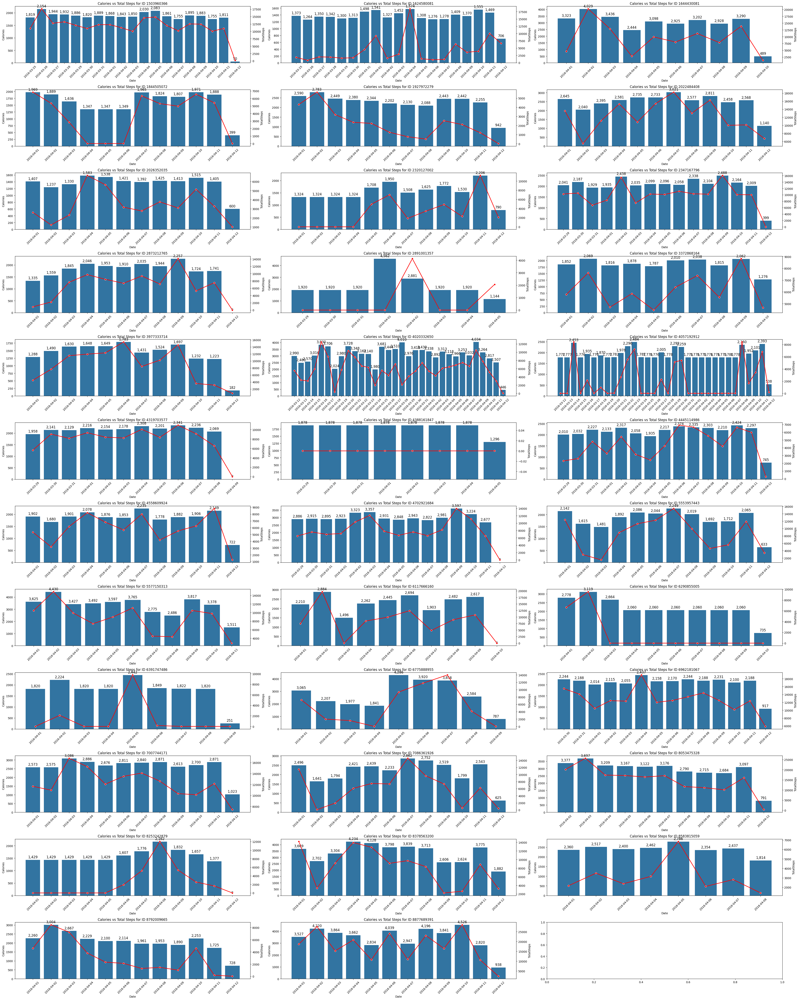

In [774]:
plottingData_daily_byId('Calories', 'TotalSteps', 'Calories vs Total Steps')

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a Fi

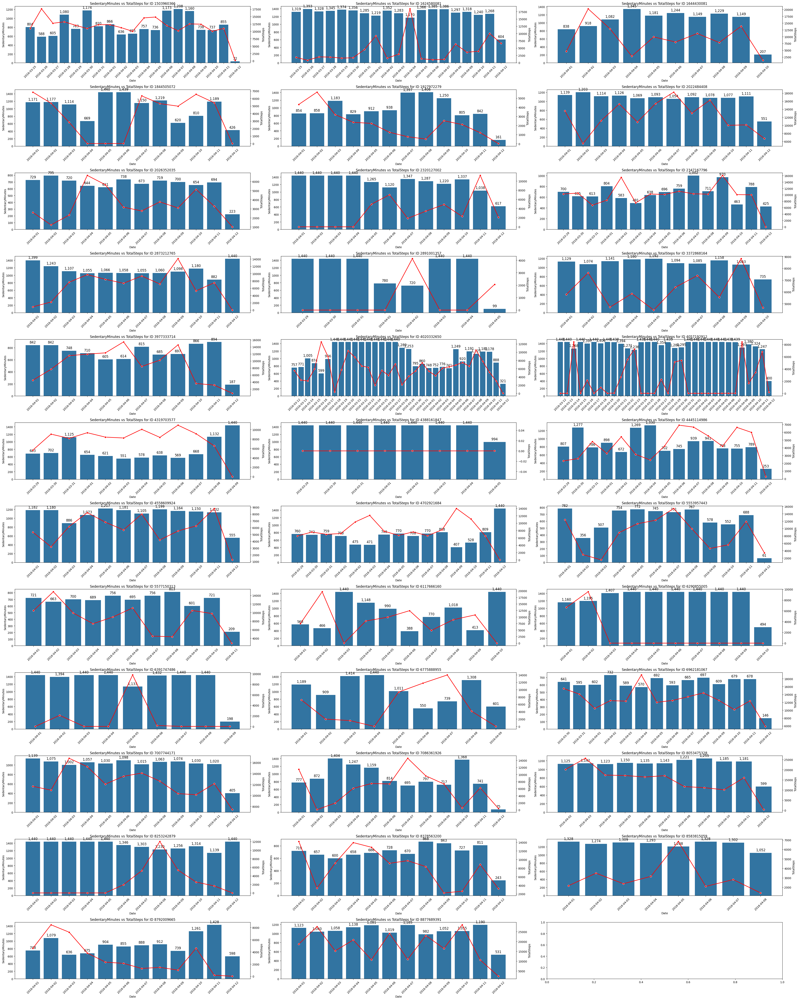

In [775]:
plottingData_daily_byId('SedentaryMinutes', 'TotalSteps', 'SedentaryMinutes vs TotalSteps')

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a Fi

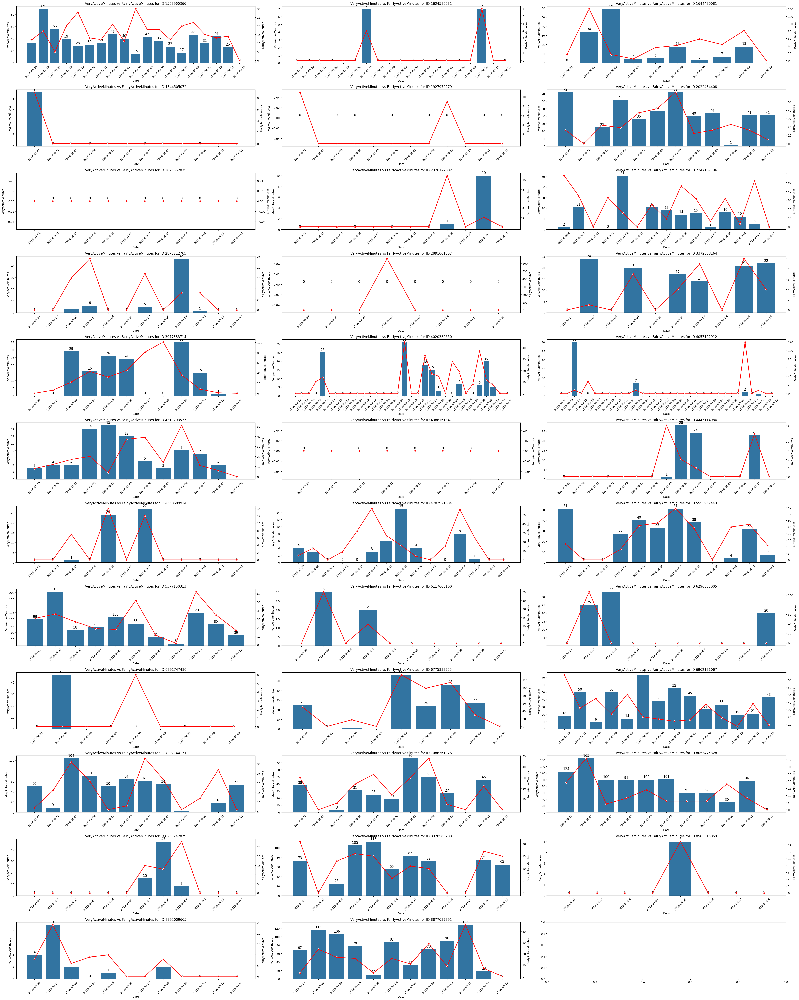

In [776]:
plottingData_daily_byId('VeryActiveMinutes', 'FairlyActiveMinutes', 'VeryActiveMinutes vs FairlyActiveMinutes')

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2800735208.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a Fi

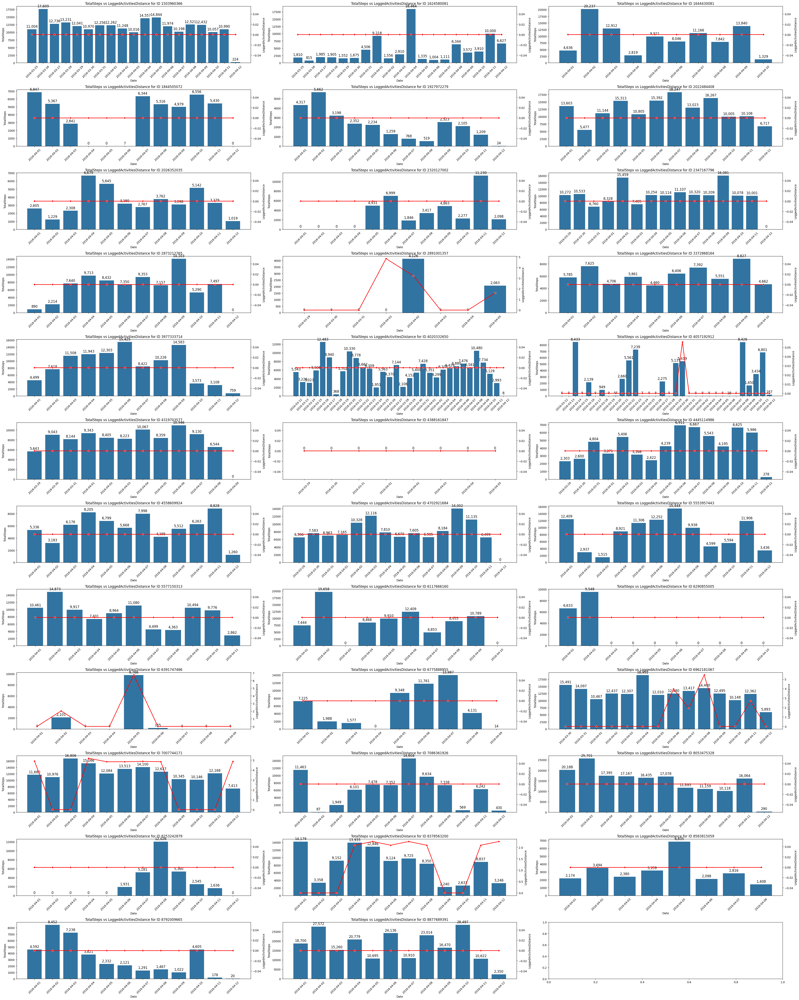

In [777]:
plottingData_daily_byId('TotalSteps', 'LoggedActivitiesDistance', 'TotalSteps vs LoggedActivitiesDistance')

### Activity distribution

In [798]:
def plotting_Activity_Distribution_daily_byId(active, moderate, light, sedentary, title):
    # Convert 'ActivityDate' in df_dailyActivity to datetime format, remove timezone info
    df_dailyActivity['ActivityDate'] = pd.to_datetime(df_dailyActivity['ActivityDate']).dt.tz_localize(None)

    # Convert 'ActivityDate' column to string format for plotting
    df_dailyActivity['ActivityDate'] = df_dailyActivity['ActivityDate'].astype(str)

    # Set the number of rows and columns for the subplots grid
    n_rows = 12  
    n_cols = 3  

    # Create a figure with subplots (12 rows, 3 columns) with a large size
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(40, 50))

    # Flatten the axes array to make it easier to iterate over
    axes = axes.flatten()

    # Loop through each 'Id' and corresponding filtered data from df_dailyActivity
    for idx, (id_specific, df_filtered) in enumerate(df_dailyActivity.groupby('Id')):
        ax = axes[idx]  # Select the subplot for this ID
        
        # Iterar sobre cada fila (usuario-día) y apilar las barras
        #for idx, row in df_dailyActivity.iterrows():
            # Crear las barras apiladas para cada día
        ax.bar(df_filtered['ActivityDate'], df_filtered[active], color='green', label='Very Active')
        ax.bar(df_filtered['ActivityDate'], df_filtered[moderate], bottom=df_filtered[active], color='yellow', label='Fairly Active')
        ax.bar(df_filtered['ActivityDate'], df_filtered[light], bottom=df_filtered[active] + df_filtered[moderate], color='orange', label='Lightly Active')
        ax.bar(df_filtered['ActivityDate'], df_filtered[sedentary], bottom=df_filtered[active] + df_filtered[moderate] + df_filtered[light], color='red', label='Sedentary')

        # Set the title of the subplot
        ax.set_title(f'{title} for ID {id_specific}')
        
        # Set labels for the x and y axes
        ax.set_xlabel('Date')
        ax.set_ylabel('Activity')
        
        # Set label for the secondary y-axis
        #ax2.set_ylabel(lineplot_variable)
        # Add legend
        ax.legend()

        # Rotate the x-axis labels for better readability
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

    # Adjust the layout to prevent overlap of subplots
    plt.tight_layout()
    # Show the plot
    plt.show()

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/818374306.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/818374306.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/818374306.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/818374306.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

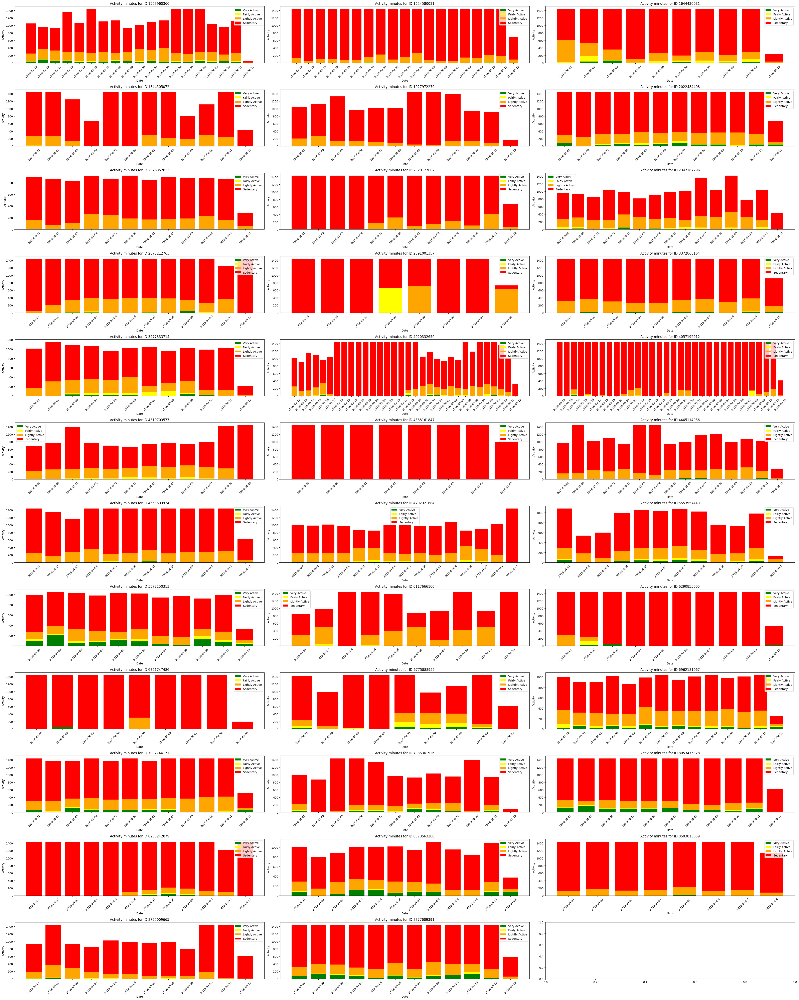

In [799]:
plotting_Activity_Distribution_daily_byId('VeryActiveMinutes', 'FairlyActiveMinutes', 'LightlyActiveMinutes', 'SedentaryMinutes', 'Activity minutes')

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/818374306.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/818374306.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/818374306.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/818374306.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

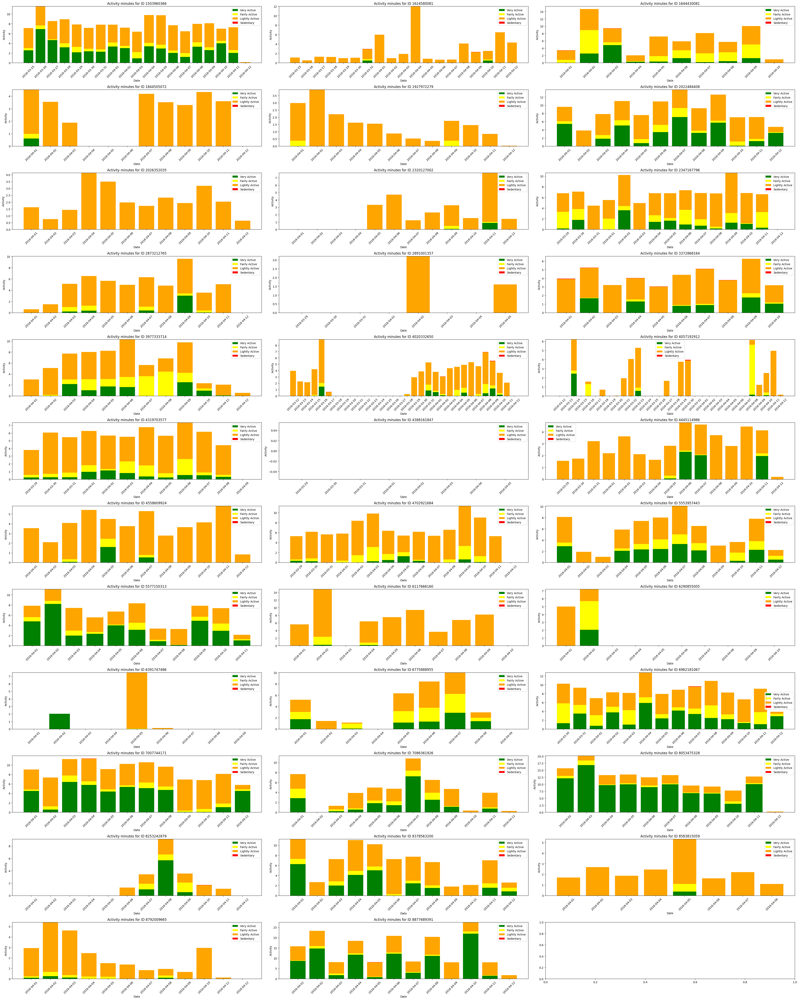

In [800]:
plotting_Activity_Distribution_daily_byId('VeryActiveDistance', 'ModeratelyActiveDistance', 'LightActiveDistance', 'SedentaryActiveDistance', 'Activity minutes')

### Understanding minuteSleep_merged dataset

Since the documentation does not provide a clear explanation of the meaning behind the values in the `minuteSleep_merged.csv` file, we will attempt to decode what these values represent through graphical representation and data exploration.

By visualizing the data and interpreting the patterns, we aim to gain a better understanding of the significance of each value. This exploratory approach will help us make educated assumptions about the nature of the data and its potential implications for sleep analysis.

In [612]:
df_minuteSleep.value.value_counts()

value
1    183038
2     12983
3      2013
Name: count, dtype: int64

In [613]:
df_minuteSleep['date'] = pd.to_datetime(df_minuteSleep['date'], format='%m/%d/%Y %I:%M:%S %p', errors='coerce')
df_filtered_sleep = df_minuteSleep[(df_minuteSleep['Id'] == 1503960366) & (df_minuteSleep['date'].dt.date == pd.to_datetime("3/26/2016").date())]
df_filtered_sleep.head()

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/3440171634.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_minuteSleep['date'] = pd.to_datetime(df_minuteSleep['date'], format='%m/%d/%Y %I:%M:%S %p', errors='coerce')


,Id,date,value,logId
4759,1503960366,2016-03-26 01:56:00,2,11227525796
4760,1503960366,2016-03-26 01:57:00,1,11227525796
4761,1503960366,2016-03-26 01:58:00,1,11227525796
4762,1503960366,2016-03-26 01:59:00,1,11227525796
4763,1503960366,2016-03-26 02:00:00,1,11227525796


In [614]:
df_filtered_sleep.shape

(472, 4)

In [615]:
df_filtered_sleep['value'].value_counts()

value
1    437
2     31
3      4
Name: count, dtype: int64

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/1845505222.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_minuteSleep['date'] = pd.to_datetime(df_minuteSleep['date'], format='%m/%d/%Y %I:%M:%S %p')


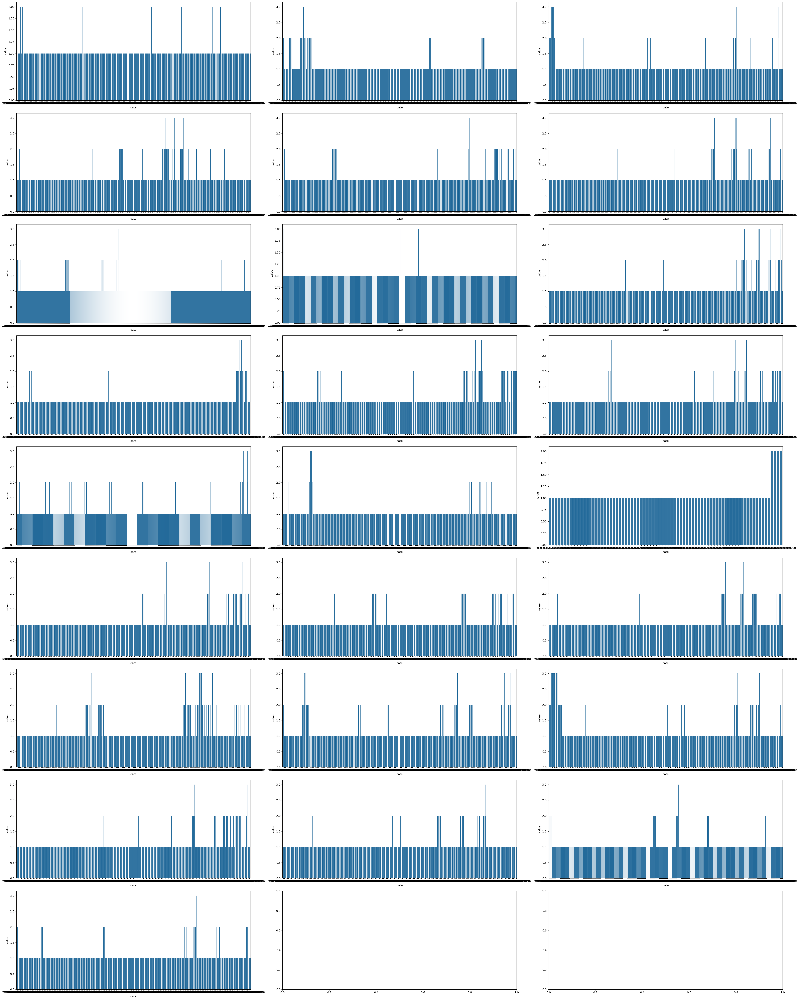

In [616]:
# Convert 'date' in df_minuteSleep to datetime format
df_minuteSleep['date'] = pd.to_datetime(df_minuteSleep['date'], format='%m/%d/%Y %I:%M:%S %p')

#Filtering dataset by id (we just need to see 1 for analysis)
df_filt = df_minuteSleep[df_minuteSleep['Id'] == 1503960366]

# Set the number of rows and columns for the subplots grid
n_cols = 3
# Number of rows is determined as a function of the total number of dates divides by number of columns (+1 to avoid loosing any graphic when applying round() funtion)
n_rows = round(len(df_filt.groupby(df_filt['date'].dt.date))//n_cols) + 1 

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(40, 50))

# Flatten the axes array to make it easier to iterate over
axes = axes.flatten()

# Loop through each 'date' and corresponding filtered data from df_minuteSleep
for idx, (id_specific, df_filtered) in enumerate(df_filt.groupby(df_filt['date'].dt.date)):
    ax = axes[idx]
    
    # Create a barplot of 'date' against 'value'
    sns.barplot(x = 'date', y = 'value', data = df_filtered, ax=ax)

# Adjust the layout to prevent overlap of subplots
plt.tight_layout()

# Show the plot
plt.show()

Based on our exploration of the data, we hypothesize the following meanings for the values in the `minuteSleep_merged.csv` file:

- **1**: Represents light sleep.
- **2**: Represents deep sleep.
- **3**: Represents moments when the person is awake.

For our analysis, we will consider **deep sleep (value 2)** as the most significant indicator of restful sleep. A higher frequency or longer duration spent in value **2** will be treated as a sign of better rest or improved sleep quality. This assumption will guide us in evaluating the relationship between physical activity and sleep quality.

In [620]:
# Convert 'ActivityDate' in df_dailyActivity to datetime format
df_dailyActivity['ActivityDate'] = pd.to_datetime(df_dailyActivity['ActivityDate'], format='%m/%d/%Y')

# Convert 'date' in df_minuteSleep to datetime format
df_minuteSleep['date'] = pd.to_datetime(df_minuteSleep['date'], format='%m/%d/%Y %I:%M:%S %p')

# As we wanna try to see the effect of the daily activity of that day to the sleepquality, we have to add an additoinal day to the date column in df_minuteSleep dataset
df_minuteSleep_temp = df_minuteSleep.copy()
df_minuteSleep_temp['date'] = df_minuteSleep_temp['date'] - pd.Timedelta(days=1)

# Group df_minuteSleep_temp by 'Id' and date, to count only the occurrences of value 2 (Deep Sleep)
df_deep_sleep = df_minuteSleep_temp[df_minuteSleep_temp['value'] == 2].groupby(['Id', df_minuteSleep_temp['date'].dt.date]).size().reset_index(name='deep_sleep_count')

# Group df_minuteSleep_temp by 'Id' and date, to count how much time the person is sleeping each day
df_time_in_bed = df_minuteSleep_temp.groupby(['Id', df_minuteSleep_temp['date'].dt.date]).size().reset_index(name='total_time_in_bed')
df_time_sleeping = df_minuteSleep_temp[df_minuteSleep_temp['value'].isin([1, 2])].groupby(['Id', df_minuteSleep_temp['date'].dt.date]).size().reset_index(name='total_time_sleeping')


# Convert the 'date' column to datetime format (for merging purposes)
df_deep_sleep['date'] = pd.to_datetime(df_deep_sleep['date'], format='%m/%d/%Y %I:%M:%S %p')
df_time_sleeping['date'] = pd.to_datetime(df_time_sleeping['date'], format='%m/%d/%Y %I:%M:%S %p')
df_time_in_bed['date'] = pd.to_datetime(df_time_in_bed['date'], format='%m/%d/%Y %I:%M:%S %p')

# Merge all dataframes (df_dailyActivity, df_deep_sleep, df_time_sleeping and df_time_in_bed) on 'Id' and corresponding date columns
df_merged = pd.merge(df_dailyActivity, df_deep_sleep, left_on=['Id', 'ActivityDate'], right_on=['Id', 'date'], how='left')
df_merged = pd.merge(df_merged, df_time_sleeping, left_on=['Id', 'ActivityDate'], right_on=['Id', 'date'], how='left')
df_merged = pd.merge(df_merged, df_time_in_bed, left_on=['Id', 'ActivityDate'], right_on=['Id', 'date'], how='left')

# Drop the 'date' column from the merged dataframe as it's no longer needed
df_merged.drop(columns=['date_x', 'date_y', 'date'], inplace=True)

# Display the first few rows of the merged dataframe
df_merged.head()

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/4101768504.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_minuteSleep['date'] = pd.to_datetime(df_minuteSleep['date'], format='%m/%d/%Y %I:%M:%S %p')


,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,deep_sleep_count,total_time_sleeping,total_time_in_bed
0,1503960366,2016-03-25,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,31.0,468.0,472.0
1,1503960366,2016-03-26,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,19.0,502.0,506.0
2,1503960366,2016-03-27,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,4.0,77.0,77.0
3,1503960366,2016-03-28,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,25.0,374.0,378.0
4,1503960366,2016-03-29,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,NaN,NaN,NaN


In [621]:
df_merged.shape

(457, 18)

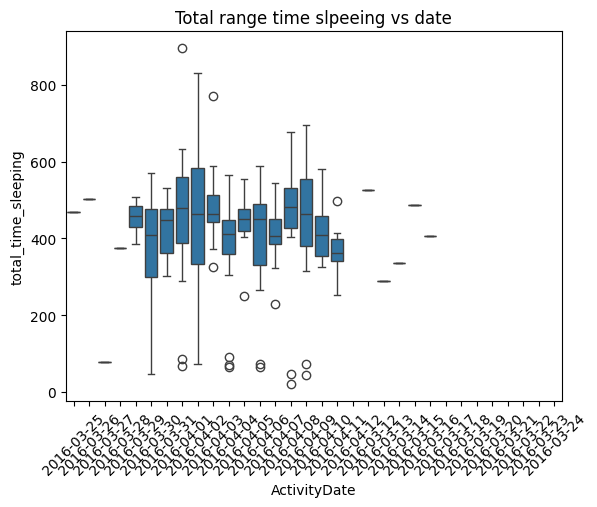

In [622]:
sns.boxplot(x='ActivityDate', y='total_time_sleeping', data = df_merged)
plt.title('Total range time slpeeing vs date')
plt.xticks(rotation=45)
plt.show()

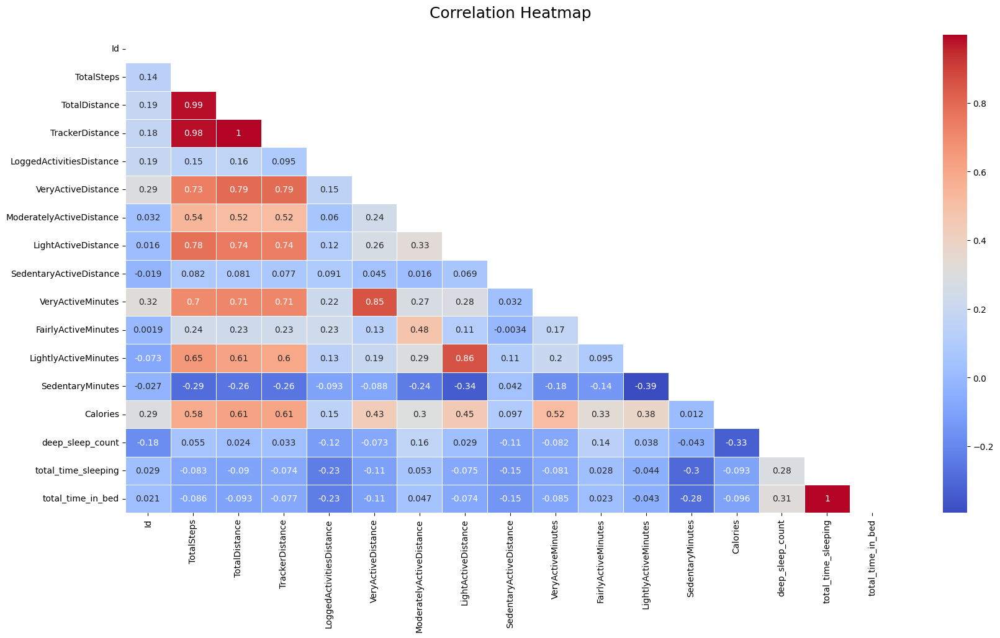

In [623]:
corr = df_merged.drop(columns=['ActivityDate']).corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(20,10))
sns.heatmap(corr, mask=mask, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap", fontsize=18, pad=20)
plt.show()

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/4130875120.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/4130875120.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/4130875120.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/4130875120.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a Fi

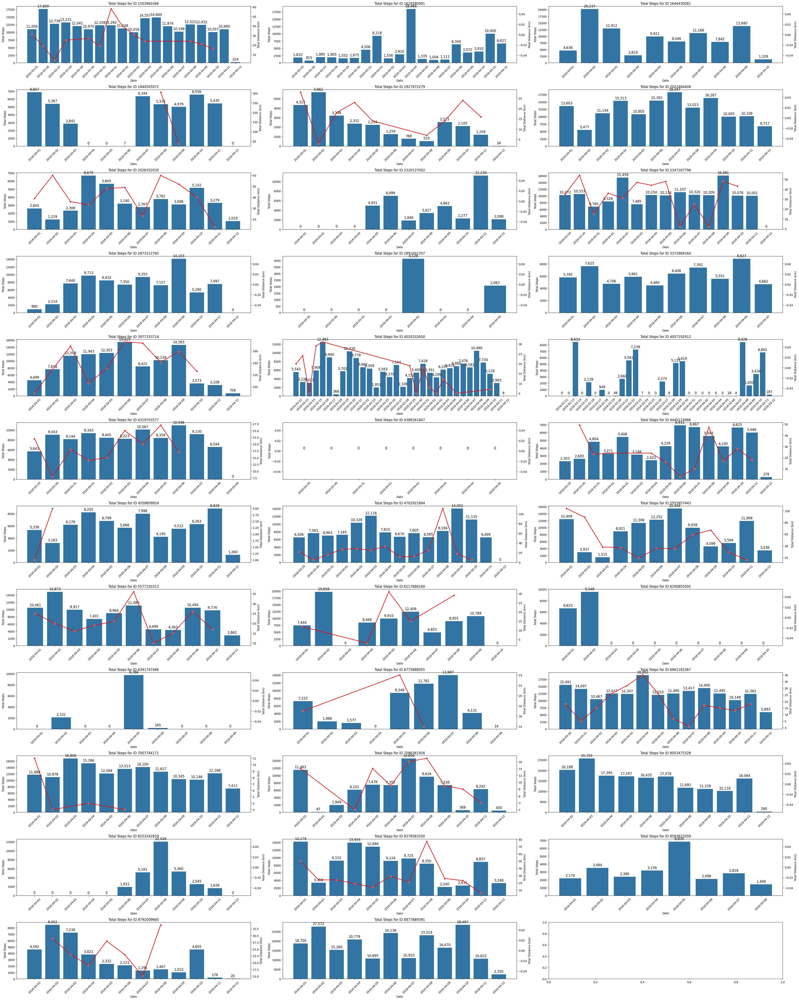

In [624]:
# Convert 'ActivityDate' in df_merged to datetime format, remove timezone info
df_merged['ActivityDate'] = pd.to_datetime(df_merged['ActivityDate']).dt.tz_localize(None)

# Convert 'ActivityDate' column to string format for plotting
df_merged['ActivityDate'] = df_merged['ActivityDate'].astype(str)

# Set the number of rows and columns for the subplots grid
n_cols = 3  
n_rows = round(len(df_merged.groupby(df_merged['Id']))//n_cols) + 1

# Create a figure with subplots (12 rows, 3 columns) with a large size
fig, axes = plt.subplots(n_rows, n_cols, figsize=(40, 50))

# Flatten the axes array to make it easier to iterate over
axes = axes.flatten()

# Loop through each 'Id' and corresponding filtered data from df_merged
for idx, (id_specific, df_filtered) in enumerate(df_merged.groupby('Id')):
    ax = axes[idx]  # Select the subplot for this ID
    
    # Create a barplot of 'TotalSteps' against 'ActivityDate'
    sns.barplot(x='ActivityDate', y='TotalSteps', data=df_filtered, ax=ax)
    
    # Annotate the bars with their respective heights (total steps)
    for p in ax.patches:
        ax.annotate(f'{p.get_height():,.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=12, color='black', xytext=(0, 10), textcoords='offset points')
    
    # Create a second y-axis for the line plot (TotalDistance)
    ax2 = ax.twinx()
    
    # Create a lineplot of 'TotalDistance' against 'ActivityDate' with a red color
    sns.lineplot(x='ActivityDate', y='deep_sleep_count', data=df_filtered, ax=ax2, color='red', marker='o', linewidth=2)

    # Set the title of the subplot
    ax.set_title(f'Total Steps for ID {id_specific}')
    
    # Set labels for the x and y axes
    ax.set_xlabel('Date')
    ax.set_ylabel('Total Steps')
    
    # Set label for the secondary y-axis (Total Distance)
    ax2.set_ylabel('Total Distance (km)')
    
    # Rotate the x-axis labels for better readability
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

# Adjust the layout to prevent overlap of subplots
plt.tight_layout()

# Show the plot
plt.show()

In [625]:
df_merged.dtypes

Id                            int64
ActivityDate                 object
TotalSteps                    int64
TotalDistance               float64
TrackerDistance             float64
LoggedActivitiesDistance    float64
VeryActiveDistance          float64
ModeratelyActiveDistance    float64
LightActiveDistance         float64
SedentaryActiveDistance     float64
VeryActiveMinutes             int64
FairlyActiveMinutes           int64
LightlyActiveMinutes          int64
SedentaryMinutes              int64
Calories                      int64
deep_sleep_count            float64
total_time_sleeping         float64
total_time_in_bed           float64
dtype: object

In [626]:
df_merged.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,deep_sleep_count,total_time_sleeping,total_time_in_bed
0,1503960366,2016-03-25,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,31.0,468.0,472.0
1,1503960366,2016-03-26,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,19.0,502.0,506.0
2,1503960366,2016-03-27,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,4.0,77.0,77.0
3,1503960366,2016-03-28,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,25.0,374.0,378.0
4,1503960366,2016-03-29,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,NaN,NaN,NaN


## How physical activity intensity affects to the total calories consumed?

## Heart Rate Analysis and Anomaly Detection

This section focuses on analyzing heart rate data to detect unusual patterns or anomalies that could indicate potential health risks or irregularities. By combining heart rate readings with additional metrics such as activity levels, sleep patterns, and intensity data, we aim to uncover insights into the relationship between physical activity and cardiovascular response.

### Goals

1. **Understand Heart Rate Patterns:** 
   - Analyze resting heart rate, maximum heart rate during activities, and variability in readings.
   - Explore correlations between heart rate and other factors like sleep and activity intensity.

2. **Detect Anomalies:** 
   - Identify abnormal spikes or drops in heart rate using machine learning models.
   - Highlight periods of unusual cardiovascular activity that may warrant further investigation.

3. **Visualize and Interpret Results:** 
   - Provide clear and actionable insights through visualizations and statistical summaries.
   - Relate findings to daily activities and suggest potential improvements for health monitoring.

### Methodology

The analysis involves the following steps:
1. **Data Preparation:** Merge minute-by-minute heart rate data with activity and sleep metrics for a comprehensive view.
2. **Exploratory Analysis:** Calculate basic metrics like average resting heart rate, maximum heart rate during intense activity, and overall variability.
3. **Anomaly Detection:** Use machine learning techniques such as Isolation Forest to identify outliers in heart rate readings.
4. **Visualization:** Plot anomalies alongside normal heart rate data to provide a clear understanding of unusual patterns.

This approach allows us to uncover meaningful insights into cardiovascular health and its relationship with lifestyle metrics, paving the way for further research and personalized health recommendations.

In [627]:
print(df_heartrate.shape)
print(df_minuteSleep.shape)
print(df_minuteIntensitiesNarrow.shape)

(1154681, 3)
(198034, 4)
(1445040, 3)


Vamos a crear un nuevo df para df_minuteSleep añadiendo 5 segundos entre las filas para poder combinarlo con heartRate y no perder información.

In [628]:
df_secondSleep = df_minuteSleep.copy()

for id_, group in df_minuteSleep.groupby(['Id', df_minuteSleep['date'].dt.date]):
    # Crear una lista para almacenar las nuevas filas
    new_rows = []

    # Recorrer cada fila en df_minuteSleep
    for idx, row in group.iterrows():
            # Crear las nuevas filas, para cada 5 segundos dentro del minuto
            for i in range(12):  # 12 intervalos de 5 segundos en un minuto
                new_row = row.copy()
                # Modificar la columna 'date' para que sea cada 5 segundos dentro del mismo minuto
                new_row['date'] = row['date'] + pd.Timedelta(seconds=5 * i - 30)
                new_rows.append(new_row)

    # Crear un nuevo dataframe con las filas nuevas
    df_temp = pd.DataFrame(new_rows)
    df_secondSleep = pd.concat([df_secondSleep, df_temp], ignore_index=True)

# Verificar el resultado
df_secondSleep.head(20)

,Id,date,value,logId
0,1503960366,2016-03-13 02:39:30,1,11114919637
1,1503960366,2016-03-13 02:40:30,1,11114919637
2,1503960366,2016-03-13 02:41:30,1,11114919637
3,1503960366,2016-03-13 02:42:30,1,11114919637
4,1503960366,2016-03-13 02:43:30,1,11114919637
5,1503960366,2016-03-13 02:44:30,1,11114919637
6,1503960366,2016-03-13 02:45:30,2,11114919637
7,1503960366,2016-03-13 02:46:30,2,11114919637
8,1503960366,2016-03-13 02:47:30,1,11114919637
9,1503960366,2016-03-13 02:48:30,1,11114919637


In [629]:
df_secondSleep.shape

(2574442, 4)

In [630]:
df_minuteSleep.shape

(198034, 4)

In [631]:
print(df_secondSleep.columns)

Index(['Id', 'date', 'value', 'logId'], dtype='object')


In [636]:
# Convert time variables in datasets to datetime format
df_heartrate['Time'] = pd.to_datetime(df_heartrate['Time'], format='%m/%d/%Y %I:%M:%S %p')
df_secondSleep['date'] = pd.to_datetime(df_secondSleep['date'], format='%m/%d/%Y %I:%M:%S %p')

# Merge all dataframes (df_hourlySteps, df_hourlyIntensities, and df_hourlyCalories) on 'Id' and corresponding date columns
df_merged_heartrate_sleeping = pd.merge(df_secondSleep, df_heartrate, left_on=['Id', 'date'], right_on=['Id', 'Time'], how='left')

# Display thape of the merged dataframe
df_merged_heartrate_sleeping.shape

(2574442, 6)

In [637]:
df_merged_heartrate_sleeping.head(20)

,Id,date,value,logId,Time,Value
0,1503960366,2016-03-13 02:39:30,1,11114919637,NaT,NaN
1,1503960366,2016-03-13 02:40:30,1,11114919637,NaT,NaN
2,1503960366,2016-03-13 02:41:30,1,11114919637,NaT,NaN
3,1503960366,2016-03-13 02:42:30,1,11114919637,NaT,NaN
4,1503960366,2016-03-13 02:43:30,1,11114919637,NaT,NaN
5,1503960366,2016-03-13 02:44:30,1,11114919637,NaT,NaN
6,1503960366,2016-03-13 02:45:30,2,11114919637,NaT,NaN
7,1503960366,2016-03-13 02:46:30,2,11114919637,NaT,NaN
8,1503960366,2016-03-13 02:47:30,1,11114919637,NaT,NaN
9,1503960366,2016-03-13 02:48:30,1,11114919637,NaT,NaN


In [638]:
df_merged_heartrate_sleeping.describe(include='all')

,Id,date,value,logId,Time,Value
count,2.574442e+06,2574442,2.574442e+06,2.574442e+06,199294,199294.000000
mean,4.825642e+09,2016-03-27 12:02:58.759170304,1.085889e+00,1.124134e+10,2016-04-05 10:17:27.406369024,63.569816
min,1.503960e+09,2016-03-11 21:19:00,1.000000e+00,1.110365e+10,2016-03-29 00:00:05,37.000000
25%,2.347168e+09,2016-03-19 06:34:45,1.000000e+00,1.116551e+10,2016-04-02 06:58:10,58.000000
50%,4.702922e+09,2016-03-28 02:57:45,1.000000e+00,1.124395e+10,2016-04-05 05:04:42.500000,63.000000
75%,6.775889e+09,2016-04-04 02:42:45,1.000000e+00,1.130901e+10,2016-04-08 04:43:30,69.000000
max,8.792010e+09,2016-04-12 08:35:25,3.000000e+00,1.137488e+10,2016-04-12 06:49:50,142.000000
std,2.176654e+09,NaN,3.143918e-01,7.962727e+07,NaN,9.307522


In [640]:
df_merged_heartrate_sleeping = df_merged_heartrate_sleeping.rename(columns = {'Value': 'heartRate', 'value': 'sleep_value'})
df_merged_heartrate_sleeping.head()

,Id,date,sleep_value,logId,Time,heartRate
0,1503960366,2016-03-13 02:39:30,1,11114919637,NaT,NaN
1,1503960366,2016-03-13 02:40:30,1,11114919637,NaT,NaN
2,1503960366,2016-03-13 02:41:30,1,11114919637,NaT,NaN
3,1503960366,2016-03-13 02:42:30,1,11114919637,NaT,NaN
4,1503960366,2016-03-13 02:43:30,1,11114919637,NaT,NaN


In [641]:
df_merged_heartrate_sleeping.shape

(2574442, 6)

In [642]:
df_merged_heartrate_sleeping = df_merged_heartrate_sleeping.dropna(subset=['heartRate'])
df_merged_heartrate_sleeping.shape

(199294, 6)

In [643]:
df_merged_heartrate_sleeping.head()

,Id,date,sleep_value,logId,Time,heartRate
36652,2026352035,2016-04-02 00:11:30,1,11284341476,2016-04-02 00:11:30,61.0
36653,2026352035,2016-04-02 00:12:30,1,11284341476,2016-04-02 00:12:30,61.0
36657,2026352035,2016-04-02 00:16:30,2,11284341476,2016-04-02 00:16:30,61.0
36659,2026352035,2016-04-02 00:18:30,1,11284341476,2016-04-02 00:18:30,60.0
36660,2026352035,2016-04-02 00:19:30,1,11284341476,2016-04-02 00:19:30,61.0


In [644]:
# Train IsolationForest
iso_sleep = IsolationForest(contamination=0.01, random_state=42)
df_merged_heartrate_sleeping['anomaly'] = iso_sleep.fit_predict(df_merged_heartrate_sleeping[['heartRate']])

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/371202844.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/371202844.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/371202844.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/371202844.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

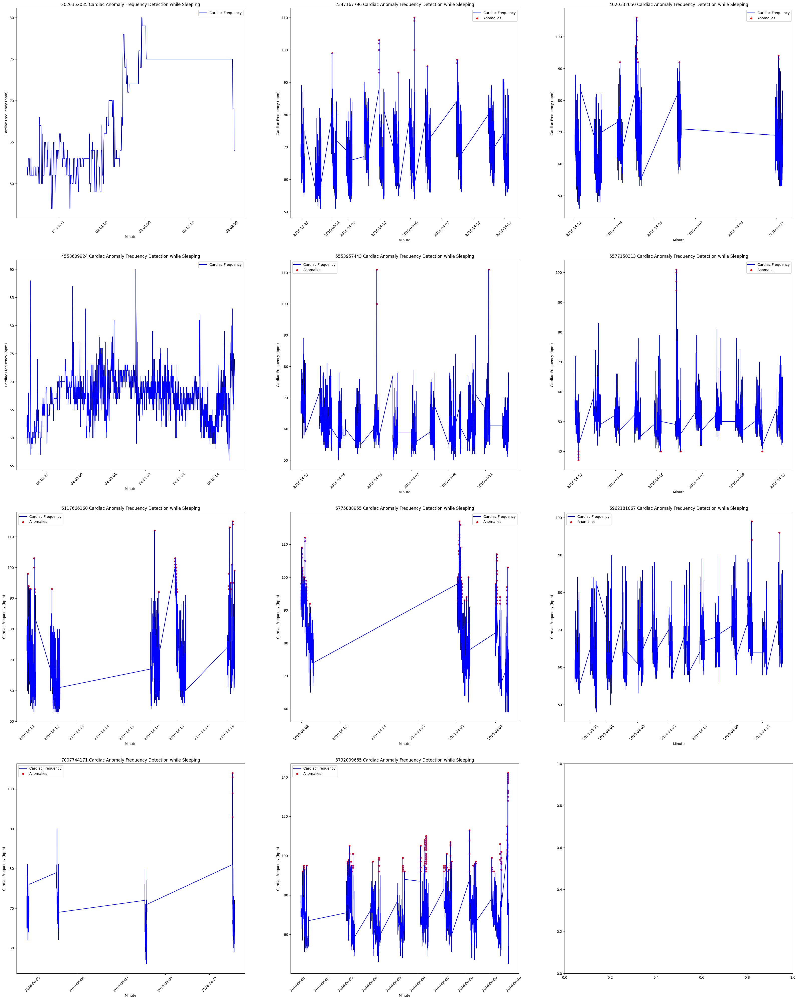

In [645]:
users = df_merged_heartrate_sleeping['Id'].unique()
n_cols = 3
n_rows = len(users)//3 + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(40,50))

axes = axes.flatten()

for idx, user in enumerate(users):
    ax = axes[idx]  

    x_data_cr = df_merged_heartrate_sleeping[df_merged_heartrate_sleeping['Id'] == user]['date']
    y_data_cr = df_merged_heartrate_sleeping[df_merged_heartrate_sleeping['Id'] == user]['heartRate']

    x_data_an = df_merged_heartrate_sleeping[(df_merged_heartrate_sleeping['Id'] == user) & (df_merged_heartrate_sleeping['anomaly'] == -1)]['date']
    y_data_an = df_merged_heartrate_sleeping[(df_merged_heartrate_sleeping['Id'] == user) & (df_merged_heartrate_sleeping['anomaly'] == -1)]['heartRate']

    sns.lineplot(x=x_data_cr, y=y_data_cr, label='Cardiac Frequency', color='blue', ax=ax)
    sns.scatterplot(x=x_data_an, y=y_data_an, color='red', label='Anomalies', ax=ax)
    
    ax.set_xlabel('Minute')
    ax.set_ylabel('Cardiac Frequency (bpm)')
    ax.set_title(f'{user} Cardiac Anomaly Frequency Detection while Sleeping')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    ax.legend()


plt.show()

-------------------






-------------------

In [427]:
# Convert 'ActivityMinute' in datasets to datetime format
df_heartrate['Time'] = pd.to_datetime(df_heartrate['Time'])
df_minuteSleep['date'] = pd.to_datetime(df_minuteSleep['date'])
df_minuteIntensitiesNarrow['ActivityMinute'] = pd.to_datetime(df_minuteIntensitiesNarrow['ActivityMinute'])

# Create a column 'minute' to join datasets for exact minute
df_heartrate['minute'] = df_heartrate['Time'].dt.floor('T')
df_minuteSleep['minute'] = df_minuteSleep['date'].dt.floor('T')
df_minuteIntensitiesNarrow['minute'] = df_minuteIntensitiesNarrow['ActivityMinute'].dt.floor('T')

# Merge all dataframes (df_hourlySteps, df_hourlyIntensities, and df_hourlyCalories) on 'Id' and corresponding date columns
df_merged_hr = df_minuteSleep.merge(df_heartrate, on=['Id', 'minute'], how='left')
df_merged_hr = df_merged_hr.merge(df_minuteIntensitiesNarrow, on=['Id', 'minute'], how='left')

# Display thape of the merged dataframe
df_merged_hr.shape

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/3423721421.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_minuteSleep['date'] = pd.to_datetime(df_minuteSleep['date'])
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/3423721421.py:7: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  df_heartrate['minute'] = df_heartrate['Time'].dt.floor('T')
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/3423721421.py:8: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  df_minuteSleep['minute'] = df_minuteSleep['date'].dt.floor('T')
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/3423721

(393592, 9)

In [430]:
# Display the first few rows of the merged dataframe
df_merged_hr.head(20)

,Id,date,value,logId,minute,Time,Value,ActivityMinute,Intensity
0,1503960366,2016-03-13 02:39:30,1,11114919637,2016-03-13 02:39:00,NaT,NaN,2016-03-13 02:39:00,0.0
1,1503960366,2016-03-13 02:40:30,1,11114919637,2016-03-13 02:40:00,NaT,NaN,2016-03-13 02:40:00,0.0
2,1503960366,2016-03-13 02:41:30,1,11114919637,2016-03-13 02:41:00,NaT,NaN,2016-03-13 02:41:00,0.0
3,1503960366,2016-03-13 02:42:30,1,11114919637,2016-03-13 02:42:00,NaT,NaN,2016-03-13 02:42:00,0.0
4,1503960366,2016-03-13 02:43:30,1,11114919637,2016-03-13 02:43:00,NaT,NaN,2016-03-13 02:43:00,0.0
5,1503960366,2016-03-13 02:44:30,1,11114919637,2016-03-13 02:44:00,NaT,NaN,2016-03-13 02:44:00,0.0
6,1503960366,2016-03-13 02:45:30,2,11114919637,2016-03-13 02:45:00,NaT,NaN,2016-03-13 02:45:00,0.0
7,1503960366,2016-03-13 02:46:30,2,11114919637,2016-03-13 02:46:00,NaT,NaN,2016-03-13 02:46:00,0.0
8,1503960366,2016-03-13 02:47:30,1,11114919637,2016-03-13 02:47:00,NaT,NaN,2016-03-13 02:47:00,0.0
9,1503960366,2016-03-13 02:48:30,1,11114919637,2016-03-13 02:48:00,NaT,NaN,2016-03-13 02:48:00,0.0


In [429]:
df_merged_hr.shape

(393592, 9)

In [424]:
df_merged_hr = df_merged_hr.rename(columns = {'Value': 'heartRate', 'value': 'sleep_value'})
df_merged_hr.head()

,Id,Time,heartRate,minute,date,sleep_value,logId,ActivityMinute,Intensity
0,2022484408,2016-04-01 07:54:00,93,2016-04-01 07:54:00,NaT,NaN,NaN,2016-04-01 07:54:00,1.0
1,2022484408,2016-04-01 07:54:05,91,2016-04-01 07:54:00,NaT,NaN,NaN,2016-04-01 07:54:00,1.0
2,2022484408,2016-04-01 07:54:10,96,2016-04-01 07:54:00,NaT,NaN,NaN,2016-04-01 07:54:00,1.0
3,2022484408,2016-04-01 07:54:15,98,2016-04-01 07:54:00,NaT,NaN,NaN,2016-04-01 07:54:00,1.0
4,2022484408,2016-04-01 07:54:20,100,2016-04-01 07:54:00,NaT,NaN,NaN,2016-04-01 07:54:00,1.0


In [426]:
df_merged_hr.minute.isnull().sum()

0

In [404]:
df_merged_hr.drop(columns=['minute', 'date', 'logId', 'ActivityMinute'], axis = 1, inplace = True)
df_merged_hr.head()

,Id,Time,heartRate,sleep_value,Intensity
0,2022484408,2016-04-01 07:54:00,93,NaN,1.0
1,2022484408,2016-04-01 07:54:05,91,NaN,1.0
2,2022484408,2016-04-01 07:54:10,96,NaN,1.0
3,2022484408,2016-04-01 07:54:15,98,NaN,1.0
4,2022484408,2016-04-01 07:54:20,100,NaN,1.0


In [405]:
df_merged_hr['sleep_value'].value_counts()

sleep_value
1.0    214827
2.0     11694
3.0      2445
Name: count, dtype: int64

Vamos a rellenar los valores nulos de 'sleep_value' "hacía delante" para perder el mínimo de información de 'heart rate'.

In [406]:
df_merged_hr['sleep_value'] = df_merged_hr['sleep_value'].ffill()
df_merged_hr.head(200)

,Id,Time,heartRate,sleep_value,Intensity
0,2022484408,2016-04-01 07:54:00,93,NaN,1.0
1,2022484408,2016-04-01 07:54:05,91,NaN,1.0
2,2022484408,2016-04-01 07:54:10,96,NaN,1.0
3,2022484408,2016-04-01 07:54:15,98,NaN,1.0
4,2022484408,2016-04-01 07:54:20,100,NaN,1.0
...,...,...,...,...,...
195,2022484408,2016-04-01 08:23:10,65,NaN,0.0
196,2022484408,2016-04-01 08:23:25,65,NaN,0.0
197,2022484408,2016-04-01 08:23:35,64,NaN,0.0
198,2022484408,2016-04-01 08:23:45,65,NaN,0.0


In [407]:
df_merged_hr['sleep_value'].value_counts()

sleep_value
1.0    1008653
2.0      73619
3.0      15926
Name: count, dtype: int64

In [408]:
df_merged_hr['Intensity'].value_counts()

Intensity
0.0    777650
1.0    292466
3.0     52777
2.0     29177
Name: count, dtype: int64

In [409]:
resting_hr_0 = df_merged_hr[df_merged_hr['Intensity'] == 0]['heartRate'].mean()
resting_hr_0

72.20933196167942

In [410]:
resting_hr_1 = df_merged_hr[df_merged_hr['Intensity'] == 1]['heartRate'].mean()
resting_hr_1

88.83663400190107

In [411]:
resting_hr_2 = df_merged_hr[df_merged_hr['Intensity'] == 2]['heartRate'].mean()
resting_hr_2

103.43787915138637

In [412]:
resting_hr_3 = df_merged_hr[df_merged_hr['Intensity'] == 3]['heartRate'].mean()
resting_hr_3

127.00017052882885

In [413]:
# Basic metrics
resting_hr = df_merged_hr[df_merged_hr['Intensity'] == 0]['heartRate'].mean()
max_hr_during_activity = df_merged_hr[df_merged_hr['Intensity'] > 0]['heartRate'].max()
variability = df_merged_hr['heartRate'].std()

print(f"Frecuencia cardíaca en reposo promedio: {resting_hr:.2f} bpm")
print(f"Máxima frecuencia cardíaca durante actividad: {max_hr_during_activity:.2f} bpm")
print(f"Variabilidad de frecuencia cardíaca: {variability:.2f}")

Frecuencia cardíaca en reposo promedio: 72.21 bpm
Máxima frecuencia cardíaca durante actividad: 185.00 bpm
Variabilidad de frecuencia cardíaca: 18.73


Esos son los parámetros a nivel global, pero deberíamos implementar el modelo para detecatar anomalías para los distintos tipos de intensidad, durante el sueño, durante la actividad física, en reposo...

Quitamos las primeras filas del dataframe donde no se ha aplicado el .ffill() para la columna 'sleep_value' para poder pasar los valores al modelo.

In [415]:
df_merged_hr_sleeping = df_merged_hr[['Id', 'Time', 'heartRate', 'sleep_value']].dropna()
df_merged_hr_sleeping

,Id,Time,heartRate,sleep_value
56483,2026352035,2016-04-02 00:08:20,62,1.0
56484,2026352035,2016-04-02 00:08:35,62,1.0
56485,2026352035,2016-04-02 00:08:50,61,1.0
56486,2026352035,2016-04-02 00:09:00,62,1.0
56487,2026352035,2016-04-02 00:09:15,62,1.0
...,...,...,...,...
1154676,8877689391,2016-04-12 09:46:25,113,1.0
1154677,8877689391,2016-04-12 09:46:30,108,1.0
1154678,8877689391,2016-04-12 09:46:35,102,1.0
1154679,8877689391,2016-04-12 09:46:40,99,1.0


In [417]:
# Train IsolationForest
iso_sleep = IsolationForest(contamination=0.01, random_state=42)
df_merged_hr_sleeping['anomaly'] = iso_sleep.fit_predict(df_merged_hr_sleeping[['heartRate']])

In [418]:
users = df_merged_hr['Id'].unique()
users

array([2022484408, 2026352035, 2347167796, 4020332650, 4558609924,
       5553957443, 5577150313, 6117666160, 6391747486, 6775888955,
       6962181067, 7007744171, 8792009665, 8877689391])

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2747722831.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2747722831.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2747722831.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/2747722831.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a Fi

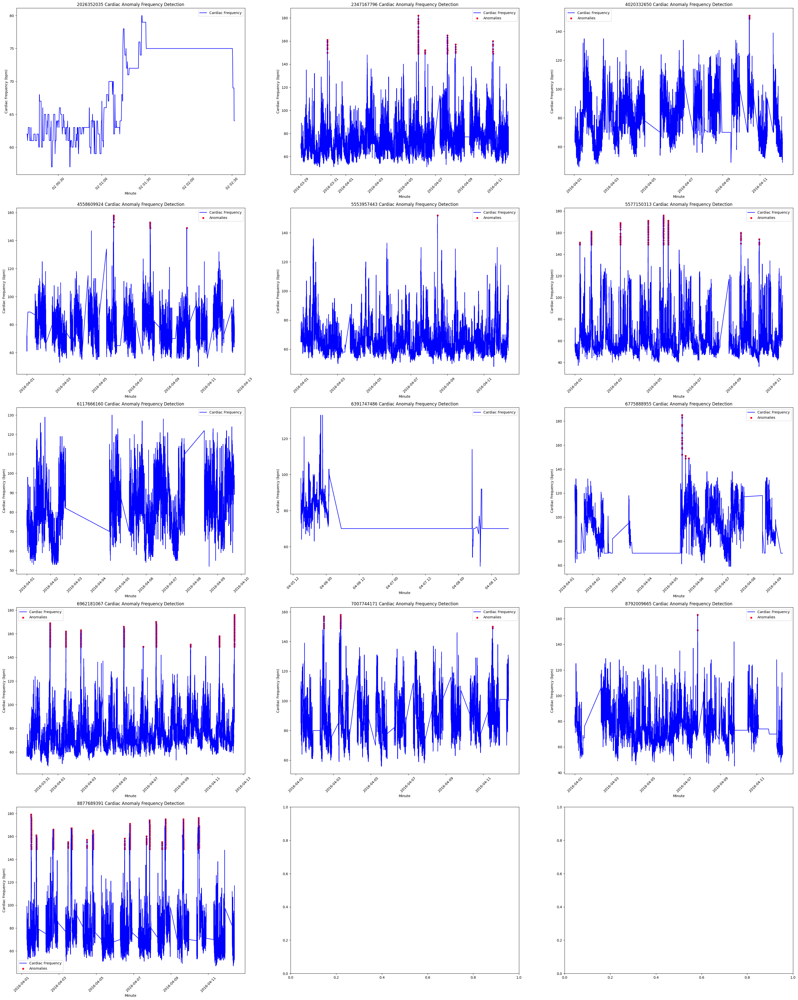

In [420]:
users = df_merged_hr_sleeping['Id'].unique()
n_cols = 3
n_rows = len(users)//3 + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(40,50))

axes = axes.flatten()

for idx, user in enumerate(users):
    ax = axes[idx]  

    x_data_cr = df_merged_hr_sleeping[df_merged_hr_sleeping['Id'] == user]['Time']
    y_data_cr = df_merged_hr_sleeping[df_merged_hr_sleeping['Id'] == user]['heartRate']

    x_data_an = df_merged_hr_sleeping[(df_merged_hr_sleeping['Id'] == user) & (df_merged_hr_sleeping['anomaly'] == -1)]['Time']
    y_data_an = df_merged_hr_sleeping[(df_merged_hr_sleeping['Id'] == user) & (df_merged_hr_sleeping['anomaly'] == -1)]['heartRate']

    sns.lineplot(x=x_data_cr, y=y_data_cr, label='Cardiac Frequency', color='blue', ax=ax)
    sns.scatterplot(x=x_data_an, y=y_data_an, color='red', label='Anomalies', ax=ax)
    
    ax.set_xlabel('Minute')
    ax.set_ylabel('Cardiac Frequency (bpm)')
    ax.set_title(f'{user} Cardiac Anomaly Frequency Detection')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    ax.legend()


plt.show()

In [540]:
# Convert time variables in datasets to datetime format
df_heartrate['Time'] = pd.to_datetime(df_heartrate['Time'], format='%m/%d/%Y %I:%M:%S %p')
df_minuteSleep['date'] = pd.to_datetime(df_minuteSleep['date'], format='%m/%d/%Y %I:%M:%S %p')

# Merge all dataframes (df_hourlySteps, df_hourlyIntensities, and df_hourlyCalories) on 'Id' and corresponding date columns
df_merged_heartrate_sleeping_temp = pd.merge(df_minuteSleep, df_heartrate, left_on=['Id', 'date'], right_on=['Id', 'Time'], how='left')

# Display thape of the merged dataframe
df_merged_heartrate_sleeping_temp.shape

/var/folders/7g/p7l3dxxd09g48svxxrg3b4880000gn/T/ipykernel_42695/15887082.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_minuteSleep['date'] = pd.to_datetime(df_minuteSleep['date'], format='%m/%d/%Y %I:%M:%S %p')


(198034, 6)

In [541]:
df_merged_heartrate_sleeping_temp = df_merged_heartrate_sleeping_temp.dropna(subset=['Value'])

In [542]:
df_merged_heartrate_sleeping_temp.head(20)

,Id,date,value,logId,Time,Value
36652,2026352035,2016-04-02 00:11:30,1,11284341476,2016-04-02 00:11:30,61.0
36653,2026352035,2016-04-02 00:12:30,1,11284341476,2016-04-02 00:12:30,61.0
36657,2026352035,2016-04-02 00:16:30,2,11284341476,2016-04-02 00:16:30,61.0
36659,2026352035,2016-04-02 00:18:30,1,11284341476,2016-04-02 00:18:30,60.0
36660,2026352035,2016-04-02 00:19:30,1,11284341476,2016-04-02 00:19:30,61.0
36661,2026352035,2016-04-02 00:20:30,2,11284341476,2016-04-02 00:20:30,65.0
36662,2026352035,2016-04-02 00:21:30,2,11284341476,2016-04-02 00:21:30,64.0
36663,2026352035,2016-04-02 00:22:30,1,11284341476,2016-04-02 00:22:30,64.0
36669,2026352035,2016-04-02 00:28:30,1,11284341476,2016-04-02 00:28:30,61.0
36670,2026352035,2016-04-02 00:29:30,1,11284341476,2016-04-02 00:29:30,64.0


In [537]:
df_merged_heartrate_sleeping_temp.Id.unique()


array([2026352035, 2347167796, 4020332650, 4558609924, 5553957443,
       5577150313, 6117666160, 6775888955, 6962181067, 7007744171,
       8792009665])

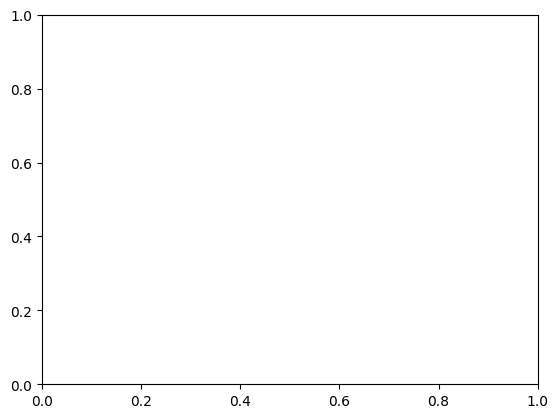

In [538]:
from datetime import datetime
df_temp = df_merged_heartrate_sleeping_temp[df_merged_heartrate_sleeping_temp['Id'] == 8378563200]

sns.boxplot(x='date', y='Value', data=df_temp[df_temp['date'].dt.date == datetime.strptime('2016-12-04', '%Y-%m-%d').date()])
plt.show()

In [634]:
# Asegurarte de que la columna 'Time' esté en formato datetime
df_heartrate['Time'] = pd.to_datetime(df_heartrate['Time'])

# Filtrar filas donde la hora está entre las 1 AM y las 6 AM
df_filtered = df_heartrate[(df_heartrate['Time'].dt.hour >= 1) & (df_heartrate['Time'].dt.hour < 6)]

# Ver los resultados
print(df_filtered)

                 Id                Time  Value
39039    2022484408 2016-04-09 05:14:00    118
39040    2022484408 2016-04-09 05:14:05    107
39041    2022484408 2016-04-09 05:14:10    103
39042    2022484408 2016-04-09 05:14:15    101
39043    2022484408 2016-04-09 05:14:20     99
...             ...                 ...    ...
1068216  8792009665 2016-04-12 05:59:00     59
1068217  8792009665 2016-04-12 05:59:10     58
1068218  8792009665 2016-04-12 05:59:25     58
1068219  8792009665 2016-04-12 05:59:40     59
1068220  8792009665 2016-04-12 05:59:55     59

[158382 rows x 3 columns]


In [635]:
df_filtered.describe()

,Id,Time,Value
count,1.583820e+05,158382,158382.000000
mean,5.187665e+09,2016-04-05 15:12:13.234338816,65.134081
min,2.022484e+09,2016-03-29 01:00:00,37.000000
25%,4.020333e+09,2016-04-02 05:21:35.750000128,59.000000
50%,5.553957e+09,2016-04-05 04:41:47.500000,64.000000
75%,6.775889e+09,2016-04-08 05:52:20,70.000000
max,8.792010e+09,2016-04-12 05:59:55,151.000000
std,1.791868e+09,NaN,10.793190
